In [ ]:
##
data preprocessing
age, from cate to number

NO >30 


取middl

convert categrocal data to numberical data

age



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
pd.set_option('display.max_columns', 10000)
pd.set_option('display.max_rows', 100000)
from sklearn.feature_selection import RFE

In [2]:
dia = pd.read_csv('dataset_diabetes/diabetic_data.csv')
dia.head(10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,?,?,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
6,55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,?,?,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,?,?,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
8,12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,?,?,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,15738,63555939,Caucasian,Female,[90-100),?,3,3,4,12,?,InternalMedicine,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [3]:
dia = dia.replace('?',np.nan)

In [4]:
dia.head(10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,35754,82637451,Caucasian,Male,[50-60),NaN,2,1,2,3,NaN,NaN,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
6,55842,84259809,Caucasian,Male,[60-70),NaN,3,1,2,4,NaN,NaN,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,63768,114882984,Caucasian,Male,[70-80),NaN,1,1,7,5,NaN,NaN,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
8,12522,48330783,Caucasian,Female,[80-90),NaN,2,1,4,13,NaN,NaN,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,15738,63555939,Caucasian,Female,[90-100),NaN,3,3,4,12,NaN,InternalMedicine,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [5]:
dia['readmitted'].value_counts()/len(dia)

NO     0.539119
>30    0.349282
<30    0.111599
Name: readmitted, dtype: float64

In [6]:
dia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      99493 non-null   object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    3197 non-null    object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                61510 non-null   object
 11  medical_specialty         51817 non-null   object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [7]:
dia.isnull().sum()[dia.isnull().sum()>1]/len(dia)*100

race                  2.233555
weight               96.858479
payer_code           39.557416
medical_specialty    49.082208
diag_1                0.020636
diag_2                0.351787
diag_3                1.398306
dtype: float64

In [8]:
dia.drop(['weight','payer_code','medical_specialty'],axis=1,inplace=True)

In [9]:
 dia['readmitted'].unique()

array(['NO', '>30', '<30'], dtype=object)

In [10]:
dia = dia.replace({"NO":0,
                         "<30":1,
                         ">30":1})

In [11]:
dia.head(10)

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),6,25,1,1,41,0,1,0,0,0,250.83,NaN,NaN,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0
1,149190,55629189,Caucasian,Female,[10-20),1,1,7,3,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,1
2,64410,86047875,AfricanAmerican,Female,[20-30),1,1,7,2,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,0
3,500364,82442376,Caucasian,Male,[30-40),1,1,7,2,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0
4,16680,42519267,Caucasian,Male,[40-50),1,1,7,1,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0
5,35754,82637451,Caucasian,Male,[50-60),2,1,2,3,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,1
6,55842,84259809,Caucasian,Male,[60-70),3,1,2,4,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0
7,63768,114882984,Caucasian,Male,[70-80),1,1,7,5,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,1
8,12522,48330783,Caucasian,Female,[80-90),2,1,4,13,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0
9,15738,63555939,Caucasian,Female,[90-100),3,3,4,12,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0


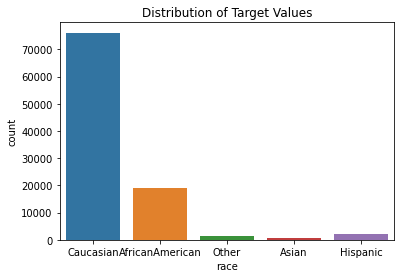

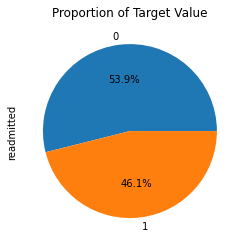

In [12]:
sns.countplot(x = "race", data = dia)
plt.title("Distribution of Target Values")
plt.show()

dia.readmitted.value_counts().plot.pie(autopct = "%.1f%%")
plt.title("Proportion of Target Value")
plt.show()

In [13]:
mapped_race = {"Asian":"Other","Hispanic":"Other"}
dia.race = dia.race.replace(mapped_race)

In [14]:
dia = dia.drop(dia.loc[dia["gender"]=="Unknown/Invalid"].index, axis=0)

In [15]:
dia.age = dia.age.replace({"[70-80)":75,
                         "[60-70)":65,
                         "[50-60)":55,
                         "[80-90)":85,
                         "[40-50)":45,
                         "[30-40)":35,
                         "[90-100)":95,
                         "[20-30)":25,
                         "[10-20)":15,
                         "[0-10)":5})


In [16]:
dia.admission_type_id.head(100)

0     6
1     1
2     1
3     1
4     1
5     2
6     3
7     1
8     2
9     3
10    1
11    2
12    1
13    1
14    3
15    1
16    1
17    1
18    1
19    3
20    2
21    2
22    2
23    2
24    3
25    1
26    1
27    1
28    2
29    1
30    1
31    1
32    1
33    2
34    2
35    1
36    3
37    1
38    1
39    2
40    1
41    2
42    2
43    1
44    1
45    3
46    3
47    3
48    3
49    2
50    2
51    3
52    1
53    1
54    3
55    2
56    3
57    2
58    2
59    3
60    1
61    1
62    1
63    1
64    1
65    2
66    1
67    2
68    2
69    2
70    1
71    1
72    2
73    3
74    1
75    1
76    1
77    3
78    2
79    2
80    3
81    1
82    1
83    1
84    2
85    1
86    3
87    2
88    2
89    3
90    1
91    2
92    2
93    2
94    1
95    2
96    1
97    1
98    1
99    2
Name: admission_type_id, dtype: int64

In [17]:
mapped = {1.0:"Emergency",
          2.0:"Emergency",
          3.0:"Elective",
          4.0:"New Born",
          5.0:np.nan,
          6.0:np.nan,
          7.0:"Trauma Center",
          8.0:np.nan}

dia.admission_type_id = dia.admission_type_id.replace(mapped)


In [18]:
dia['discharge_disposition_id'].unique()
mapped_discharge = {1:"Discharged to Home",
                    6:"Discharged to Home",
                    8:"Discharged to Home",
                    13:"Discharged to Home",
                    19:"Discharged to Home",
                    18:np.nan,25:np.nan,26:np.nan,
                    2:"Other",3:"Other",4:"Other",
                    5:"Other",7:"Other",9:"Other",
                    10:"Other",11:"Other",12:"Other",
                    14:"Other",15:"Other",16:"Other",
                    17:"Other",20:"Other",21:"Other",
                    22:"Other",23:"Other",24:"Other",
                    27:"Other",28:"Other",29:"Other",30:"Other"}

dia["discharge_disposition_id"] = dia["discharge_disposition_id"].replace(mapped_discharge)

In [19]:
mapped_adm = {1:"Referral",2:"Referral",3:"Referral",
              4:"Other",5:"Other",6:"Other",10:"Other",22:"Other",25:"Other",
              9:"Other",8:"Other",14:"Other",13:"Other",11:"Other",
              15:np.nan,17:np.nan,20:np.nan,21:np.nan,
              7:"Emergency"}
dia.admission_source_id = dia.admission_source_id.replace(mapped_adm)

In [20]:
def map_diagnosis(data, cols):
    for col in cols:
        data.loc[(data[col].str.contains("V")) | (data[col].str.contains("E")), col] = -1
        data[col] = data[col].astype(np.float16)

    for col in cols:
        data["temp_diag"] = np.nan
        data.loc[(data[col]>=390) & (data[col]<=459) | (data[col]==785), "temp_diag"] = "Circulatory"
        data.loc[(data[col]>=460) & (data[col]<=519) | (data[col]==786), "temp_diag"] = "Respiratory"
        data.loc[(data[col]>=520) & (data[col]<=579) | (data[col]==787), "temp_diag"] = "Digestive"
        data.loc[(data[col]>=250) & (data[col]<251), "temp_diag"] = "Diabetes"
        data.loc[(data[col]>=800) & (data[col]<=999), "temp_diag"] = "Injury"
        data.loc[(data[col]>=710) & (data[col]<=739), "temp_diag"] = "Muscoloskeletal"
        data.loc[(data[col]>=580) & (data[col]<=629) | (data[col] == 788), "temp_diag"] = "Genitourinary"
        data.loc[(data[col]>=140) & (data[col]<=239), "temp_diag"] = "Neoplasms"

        data["temp_diag"] = data["temp_diag"].fillna("Other")
        data[col] = data["temp_diag"]
        data = data.drop("temp_diag", axis=1)

    return data

In [21]:
dia = map_diagnosis(dia,["diag_1","diag_2","diag_3"])

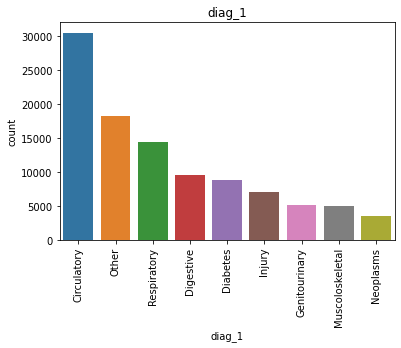

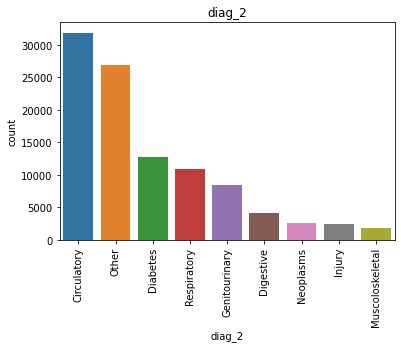

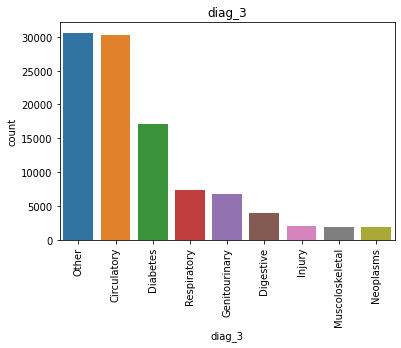

In [22]:
def plot_diags(col,data):
    sns.countplot(x = col, data = data,
            order = data[f"{col}"].value_counts().index)
    plt.xticks(rotation = 90)
    plt.title(col)
    plt.show()

diag_cols = ["diag_1","diag_2","diag_3"]

for diag in diag_cols:
    plot_diags(diag,dia)

In [23]:
dia.change = dia.change.replace("Ch","Yes")

In [24]:
dia["max_glu_serum"] = dia["max_glu_serum"].replace({">200":2,
                                                        ">300":2,
                                                        "Norm":1,
                                                        "None":0}) 

In [25]:
dia["A1Cresult"] = dia["A1Cresult"].replace({">7":2,
                                           ">8":2,
                                           "Norm":1,
                                           "None":0})

In [26]:
dia.isnull().sum()

encounter_id                    0
patient_nbr                     0
race                         2271
gender                          0
age                             0
admission_type_id           10396
discharge_disposition_id     4680
admission_source_id          6942
time_in_hospital                0
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                          0
diag_2                          0
diag_3                          0
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide                       0
glyburide                       0
tolbutamide   

In [27]:
dia['race'] = dia['race'].fillna(dia['race'].mode()[0])

In [28]:
dia['discharge_disposition_id'] = dia['discharge_disposition_id'].fillna(dia['discharge_disposition_id'].mode()[0])

In [29]:
dia['admission_source_id'] = dia['admission_source_id'].fillna(dia['admission_source_id'].mode()[0])

In [30]:
cat_data = dia.select_dtypes('O')

num_data = dia.select_dtypes(np.number)

In [31]:
cat_data.head(10)

,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed
0,Caucasian,Female,NaN,Discharged to Home,Referral,Diabetes,Other,Other,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
1,Caucasian,Female,Emergency,Discharged to Home,Emergency,Other,Diabetes,Other,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Yes,Yes
2,AfricanAmerican,Female,Emergency,Discharged to Home,Emergency,Other,Diabetes,Other,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes
3,Caucasian,Male,Emergency,Discharged to Home,Emergency,Other,Diabetes,Circulatory,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Yes,Yes
4,Caucasian,Male,Emergency,Discharged to Home,Emergency,Neoplasms,Neoplasms,Diabetes,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Yes,Yes
5,Caucasian,Male,Emergency,Discharged to Home,Referral,Circulatory,Circulatory,Diabetes,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes
6,Caucasian,Male,Elective,Discharged to Home,Referral,Circulatory,Circulatory,Other,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Yes,Yes
7,Caucasian,Male,Emergency,Discharged to Home,Emergency,Circulatory,Respiratory,Diabetes,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes
8,Caucasian,Female,Emergency,Discharged to Home,Other,Circulatory,Circulatory,Other,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Yes,Yes
9,Caucasian,Female,Elective,Other,Other,Circulatory,Neoplasms,Respiratory,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Yes,Yes


In [32]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for i in cat_data:
    cat_data[i] = le.fit_transform(cat_data[i])

/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
cat_data.head(10)

,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed
0,1,0,4,0,2,1,7,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0
1,1,0,1,0,0,7,1,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1
2,0,0,1,0,0,7,1,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1
3,1,1,1,0,0,7,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1
4,1,1,1,0,0,6,6,1,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1
5,1,1,1,0,2,0,0,1,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,0,1
6,1,1,0,0,2,0,0,7,2,1,1,1,2,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1
7,1,1,1,0,0,0,8,1,1,1,1,1,1,0,1,2,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1
8,1,0,1,0,1,0,0,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1
9,1,0,0,1,1,0,6,8,1,1,1,1,1,0,1,1,0,1,2,1,1,0,0,0,0,2,1,0,0,0,0,1,1


In [34]:
data = pd.concat([num_data,cat_data],axis=1)
data.head()

,encounter_id,patient_nbr,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,readmitted,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed
0,2278392,8222157,5,1,41,0,1,0,0,0,1,0,0,0,1,0,4,0,2,1,7,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0
1,149190,55629189,15,3,59,0,18,0,0,0,9,0,0,1,1,0,1,0,0,7,1,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1
2,64410,86047875,25,2,11,5,13,2,0,1,6,0,0,0,0,0,1,0,0,7,1,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1
3,500364,82442376,35,2,44,1,16,0,0,0,7,0,0,0,1,1,1,0,0,7,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1
4,16680,42519267,45,1,51,0,8,0,0,0,5,0,0,0,1,1,1,0,0,6,6,1,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1


In [35]:
data.drop(['encounter_id','patient_nbr'],axis=1,inplace=True)

In [36]:
X = data.drop('readmitted',axis=1)

y = data['readmitted']

In [37]:
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler 

In [48]:
def roughthery(data, para): 
    all = data
    all_1 = all[all['readmitted']==0].drop(['readmitted'],axis = 1)
    all_2 = all[all['readmitted']==1].drop(['readmitted'], axis = 1)
    all_1 = all_1.to_numpy()
    all_2 = all_2.to_numpy()
    score = np.zeros(all_1.shape[1])    
    for i in all_1:
        
        score = (~(i==all_2)).sum(0) + score
    
    select = score>((all_1.shape[0]*all_2.shape[0])/para)
    select = np.append(select, True)
    data = data.loc[:, select]
    return data

In [53]:
da = pd.concat([X, y], axis = 1)
new_X = roughthery(da, 2)

In [81]:
new_X.shape

(101763, 12)

In [75]:
new_X= new_X.drop(['readmitted'], axis = 1)

KeyError: "['readmitted'] not found in axis"

In [77]:
X_train,X_test,y_train,y_test = train_test_split(new_X,y,test_size=0.1,random_state=1)

In [39]:
SC = StandardScaler()

X_train_scaled = pd.DataFrame(SC.fit_transform(X_train),columns=X_train.columns)
X_test_scaled = pd.DataFrame(SC.transform(X_test),columns=X_test.columns)

In [40]:
X_train_scaled.head(10)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed
0,0.567189,-0.802915,0.046684,-0.784494,-0.741037,-0.290478,-0.217638,-0.501943,-0.735290,-0.222763,-0.430755,0.321231,-0.927724,2.756442,-0.546691,1.459875,-1.125931,1.089101,-1.071851,1.842446,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,2.603127,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-0.483573,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,1.078925,0.545377
1,0.567189,0.537254,-0.004119,-0.784494,-1.110428,-0.290478,-0.217638,-0.501943,0.815065,-0.222763,-0.430755,0.321231,-0.927724,-0.116340,1.829187,1.459875,-0.487786,-1.086800,-0.757233,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-0.483573,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,-0.926848,-1.833595
2,1.193965,-0.467872,0.503906,0.387483,0.982788,-0.290478,-0.217638,-0.501943,0.815065,-0.222763,-0.430755,2.514484,-0.927724,-0.116340,-0.546691,0.361094,-1.125931,-0.154271,1.130476,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,0.709448,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,-0.926848,0.545377
3,1.193965,-0.802915,-0.410538,-0.784494,-0.864167,-0.290478,-0.217638,0.290250,0.815065,-0.222763,-0.430755,0.321231,-0.927724,-0.116340,-0.546691,-0.737688,1.426651,1.089101,1.130476,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-0.483573,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,-0.926848,-1.833595
4,-1.939915,-0.802915,0.910326,2.731437,-0.125385,1.285991,-0.217638,0.290250,-0.735290,-0.222763,-0.430755,2.514484,1.077907,-0.116340,-0.546691,-0.737688,0.150360,-1.086800,-1.071851,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,2.407219,-0.295087,-0.015501,3.418987,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-0.483573,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,1.078925,0.545377
5,0.567189,-1.137957,-0.461341,-0.198505,0.367136,-0.290478,-0.217638,-0.501943,-1.252075,-0.222763,-0.430755,0.321231,1.077907,-1.073934,-0.546691,1.459875,-1.125931,-0.775957,-1.071851,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,0.709448,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,-0.926848,0.545377
6,1.820741,0.537254,0.757918,-0.784494,-0.864167,-0.290478,-0.217638,0.290250,-1.768860,-0.222763,-0.430755,0.321231,1.077907,-0.116340,1.829187,-0.737688,1.426651,-0.775957,-0.442614,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-0.483573,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,-0.926848,-1.833595
7,-0.686363,0.202212,0.249894,-0.784494,0.982788,-0.290478,0.884952,0.290250,0.815065,-0.222763,-0.430755,0.321231,1.077907,-0.116340,-0.546691,-0.737688,1.426651,-1.086800,1.130476,-0.450528,-0.113591,-0.079569,-0.027276,-0.208401,-0.003304,-0.333960,-0.295087,-0.015501,-0.265518,-0.24732,-0.053345,-0.013938,-0.005723,-0.019858,0.0,0.0,-1.676593,-0.081886,-0.01096,-0.003304,-0.003304,-0.003304,1.078925,0.545377
8,-0.059587,-0.467872,2.129585,-0.784494,0.120876,-

In [41]:
LR = LogisticRegression()

LR.fit(X_train_scaled,y_train)

LogisticRegression()

In [42]:
LR.score(X_train_scaled,y_train)

0.6216561483196121

In [43]:
LR.score(X_test_scaled,y_test)

0.6163898987913924

In [41]:
import time
from sklearn.metrics import roc_auc_score

In [78]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import tree

random_forest = RandomForestClassifier(
      max_depth = 5,random_state=10)
random_forest.fit(X_train, y_train)

gradient_boosting = GradientBoostingClassifier(
     max_depth = 5,random_state=10)
xgb = gradient_boosting.fit(X_train, y_train)


clf = tree.DecisionTreeClassifier(max_depth = 5 )
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

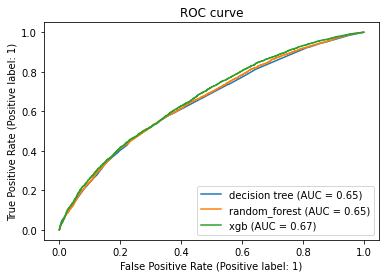

In [79]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_roc_curve

fig, ax = plt.subplots()

models = [
    ("decision tree", clf),
    ("random_forest", random_forest),
   
    ("xgb", xgb),
  
]

model_displays = {}
for name, pipeline in models:
    model_displays[name] = plot_roc_curve(
        pipeline, X_test, y_test, ax=ax, name=name)
_ = ax.set_title('ROC curve')

In [46]:
pred = LR.predict_proba(X_test_scaled)[:, 1]
roc_score = roc_auc_score(y_test, pred)
print('AUC is {}'.format(roc_score))

###Logistic regression()
###based on mode inputation

AUC is 0.6578203849381732


In [46]:
RF.feature_importances_.rank

NameError: name 'RF' is not defined

In [47]:
X_train.columns

Index(['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'race', 'gender', 'admission_type_id', 'discharge_disposition_id',
       'admission_source_id', 'diag_1', 'diag_2', 'diag_3', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed'],
      dtype='object')

In [51]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': RF.feature_importances_})


important_features = important_features.sort_values('Importance', ascending = False)

NameError: name 'RF' is not defined

In [49]:
important_features.shape

NameError: name 'important_features' is not defined

In [50]:
ten_feature = important_features['Features'].head(10).tolist()

NameError: name 'important_features' is not defined

In [95]:
a = X_train.shape[0]
for i in range(a):
    print(X_train.loc(i))

ValueError: No axis named 2 for object type DataFrame

In [116]:
all.head(10)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,5,1,41,0,1,0,0,0,1,0,0,1,0,4,0,2,1,7,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0
1,15,3,59,0,18,0,0,0,9,0,0,1,0,1,0,0,7,1,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1,1
2,25,2,11,5,13,2,0,1,6,0,0,0,0,1,0,0,7,1,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0
3,35,2,44,1,16,0,0,0,7,0,0,1,1,1,0,0,7,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1,0
4,45,1,51,0,8,0,0,0,5,0,0,1,1,1,0,0,6,6,1,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
5,55,3,31,6,16,0,0,0,9,0,0,1,1,1,0,2,0,0,1,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,0,1,1
6,65,4,70,1,21,0,0,0,7,0,0,1,1,0,0,2,0,0,7,2,1,1,1,2,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
7,75,5,73,0,12,0,0,0,8,0,0,1,1,1,0,0,0,8,1,1,1,1,1,1,0,1,2,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1
8,85,13,68,2,28,0,0,0,8,0,0,1,0,1,0,1,0,0,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
9,95,12,33,3,18,0,0,0,8,0,0,1,0,0,1,1,0,6,8,1,1,1,1,1,0,1,1,0,1,2,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0


In [38]:
all = pd.concat((X,y),axis = 1)
all_1 = all[all['readmitted']==0].drop(['readmitted'],axis = 1)
all_2 = all[all['readmitted']==1].drop(['readmitted'], axis = 1)
all.to_csv('all.csv',index = False)

In [74]:
pd.read_csv('all.csv').head(10)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,5,1,41,0,1,0,0,0,1,0,0,1,0,4,0,2,1,7,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0
1,15,3,59,0,18,0,0,0,9,0,0,1,0,1,0,0,7,1,7,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1,1
2,25,2,11,5,13,2,0,1,6,0,0,0,0,1,0,0,7,1,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0
3,35,2,44,1,16,0,0,0,7,0,0,1,1,1,0,0,7,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,3,1,0,0,0,0,1,1,0
4,45,1,51,0,8,0,0,0,5,0,0,1,1,1,0,0,6,6,1,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
5,55,3,31,6,16,0,0,0,9,0,0,1,1,1,0,2,0,0,1,1,1,1,1,1,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,0,1,1
6,65,4,70,1,21,0,0,0,7,0,0,1,1,0,0,2,0,0,7,2,1,1,1,2,0,1,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
7,75,5,73,0,12,0,0,0,8,0,0,1,1,1,0,0,0,8,1,1,1,1,1,1,0,1,2,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1
8,85,13,68,2,28,0,0,0,8,0,0,1,0,1,0,1,0,0,7,1,1,1,1,1,0,2,1,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0
9,95,12,33,3,18,0,0,0,8,0,0,1,0,0,1,1,0,6,8,1,1,1,1,1,0,1,1,0,1,2,1,1,0,0,0,0,2,1,0,0,0,0,1,1,0


In [39]:
all_1 = all_1.to_numpy()
all_2 = all_2.to_numpy()

In [40]:
score = np.zeros(44)
score

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [53]:
all_2.shape

(46902, 44)

In [41]:

for i in all_1:
    
    score = (~(i==all_2)).sum(0) + score
    

In [42]:
score

array([2.10130339e+09, 2.26714308e+09, 2.53272696e+09, 1.84850207e+09,
       2.46973498e+09, 7.72571887e+08, 5.46110788e+08, 1.37971024e+09,
       1.84195158e+09, 2.60708958e+08, 7.44505064e+08, 9.49362725e+08,
       1.27941123e+09, 1.15193233e+09, 9.11837761e+08, 1.29321222e+09,
       2.13975438e+09, 2.04461006e+09, 2.00871680e+09, 8.25184781e+08,
       7.78447960e+07, 3.54589570e+07, 4.34060500e+06, 2.50682017e+08,
       5.48610000e+04, 5.71523639e+08, 4.88410820e+08, 1.14217800e+06,
       3.46190453e+08, 3.03533569e+08, 1.58584120e+07, 1.97272100e+06,
       1.56620000e+05, 1.93199500e+06, 0.00000000e+00, 0.00000000e+00,
       1.71596185e+09, 3.55431320e+07, 6.73318000e+05, 5.48610000e+04,
       9.38040000e+04, 4.69020000e+04, 1.28250695e+09, 9.09097377e+08])

In [43]:
select = (score>((all_1.shape[0]*all_2.shape[0])/2))

In [49]:
select = np.append(select,True)

In [50]:
all.loc[:,select].head(10)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_inpatient,number_diagnoses,admission_source_id,diag_1,diag_2,diag_3,insulin,readmitted
0,5,1,41,0,1,0,1,2,1,7,7,1,0
1,15,3,59,0,18,0,9,0,7,1,7,3,1
2,25,2,11,5,13,1,6,0,7,1,7,1,0
3,35,2,44,1,16,0,7,0,7,1,0,3,0
4,45,1,51,0,8,0,5,0,6,6,1,2,0
5,55,3,31,6,16,0,9,2,0,0,1,2,1
6,65,4,70,1,21,0,7,2,0,0,7,2,0
7,75,5,73,0,12,0,8,0,0,8,1,1,1
8,85,13,68,2,28,0,8,1,0,0,7,2,0
9,95,12,33,3,18,0,8,1,0,6,8,2,0


In [93]:
len(all_1.columns.tolist())
for i, j in zip(all.columns, select):
    print (i, j)
    

age True
time_in_hospital True
num_lab_procedures True
num_procedures True
num_medications True
number_outpatient False
number_emergency False
number_inpatient True
number_diagnoses True
max_glu_serum False
A1Cresult False
race False
gender False
admission_type_id False
discharge_disposition_id False
admission_source_id True
diag_1 True
diag_2 True
diag_3 True
metformin False
repaglinide False
nateglinide False
chlorpropamide False
glimepiride False
acetohexamide False
glipizide False
glyburide False
tolbutamide False
pioglitazone False
rosiglitazone False
acarbose False
miglitol False
troglitazone False
tolazamide False
examide False
citoglipton False
insulin True
glyburide-metformin False
glipizide-metformin False
glimepiride-pioglitazone False
metformin-rosiglitazone False
metformin-pioglitazone False
change False
diabetesMed False


In [ ]:
from math import log
import operator

def calcShannonEnt(dataSet):  # 计算数据的熵(entropy)
    numEntries=len(dataSet)  # 数据条数
    labelCounts={}
    for featVec in dataSet:
        currentLabel=featVec[-1] # 每行数据的最后一个字（类别）
        if currentLabel not in labelCounts.keys():
            labelCounts[currentLabel]=0
        labelCounts[currentLabel]+=1  # 统计有多少个类以及每个类的数量
    shannonEnt=0
    for key in labelCounts:
        prob=float(labelCounts[key])/numEntries # 计算单个类的熵值
        shannonEnt-=prob*log(prob,2) # 累加每个类的熵值
    return shannonEnt



def splitDataSet(dataSet,axis,value): # 按某个特征分类后的数据
    retDataSet=[]
    for featVec in dataSet:
        if featVec[axis]==value:
            reducedFeatVec =featVec[:axis]
            reducedFeatVec.extend(featVec[axis+1:])
            retDataSet.append(reducedFeatVec)
    return retDataSet

def chooseBestFeatureToSplit(dataSet):  # 选择最优的分类特征
    numFeatures = len(dataSet[0])-1
    baseEntropy = calcShannonEnt(dataSet)  # 原始的熵
    bestInfoGain = 0
    bestFeature = -1
    for i in range(numFeatures):
        featList = [example[i] for example in dataSet]
        uniqueVals = set(featList)
        newEntropy = 0
        for value in uniqueVals:
            subDataSet = splitDataSet(dataSet,i,value)
            prob =len(subDataSet)/float(len(dataSet))
            newEntropy +=prob*calcShannonEnt(subDataSet)  # 按特征分类后的熵
        infoGain = baseEntropy - newEntropy  # 原始熵与按特征分类后的熵的差值
        if (infoGain>bestInfoGain):   # 若按某特征划分后，熵值减少的最大，则次特征为最优分类特征
            bestInfoGain=infoGain
            bestFeature = i
    return bestFeature

def majorityCnt(classList):    #按分类后类别数量排序，比如：最后分类为2男1女，则判定为男；
    classCount={}
    for vote in classList:
        if vote not in classCount.keys():
            classCount[vote]=0
        classCount[vote]+=1
    sortedClassCount = sorted(classCount.items(),key=operator.itemgetter(1),reverse=True)
    return sortedClassCount[0][0]

def createTree(dataSet,labels):
    classList=[example[-1] for example in dataSet]  # 类别：男或女
    if classList.count(classList[0])==len(classList):
        return classList[0]
    if len(dataSet[0])==1:
        return majorityCnt(classList)
    bestFeat=chooseBestFeatureToSplit(dataSet) #选择最优特征
    bestFeatLabel=labels[bestFeat]
    myTree={bestFeatLabel:{}} #分类结果以字典形式保存
    del(labels[bestFeat])
    featValues=[example[bestFeat] for example in dataSet]
    uniqueVals=set(featValues)
    for value in uniqueVals:
        subLabels=labels[:]
        myTree[bestFeatLabel][value]=createTree(splitDataSet\
                            (dataSet,bestFeat,value),subLabels)
    return myTree


if __name__=='__main__':
    dataSet, labels=createDataSet1()  # 创造示列数据
    print(createTree(dataSet, labels))  # 输出决策树模型结果


In [66]:
from sklearn.datasets import load_iris
from sklearn import tree
from sklearn.metrics import roc_auc_score
for i in [5,10,50,100,500,1000]:
    
    clf = tree.DecisionTreeClassifier(min_samples_split = i)
    clf = clf.fit(X_train, y_train)
#tree.plot_tree(clf)  
    pred = clf.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print(roc_score)

0.5591354559176449
0.5654387913555675
0.6050632695389397
0.6291140131518733
0.6594485071119088
0.6651405550220827


In [62]:
clf = tree.DecisionTreeClassifier(max_depth = i)
clf = clf.fit(X_train, y_train)
#tree.plot_tree(clf)  
pred = clf.predict_proba(X_test)[:, 1]
roc_score = roc_auc_score(y_test, pred)
print(roc_score)

0.5692999047505286


[Text(195.71520695480655, 214.91162790697675, 'X[7] <= 0.5\ngini = 0.497\nsamples = 91586\nvalue = [49444, 42142]'),
 Text(97.30983788205339, 209.85488372093022, 'X[8] <= 5.5\ngini = 0.473\nsamples = 60942\nvalue = [37513, 23429]'),
 Text(22.75654933129323, 204.79813953488372, 'X[15] <= 0.5\ngini = 0.416\nsamples = 14534\nvalue = [10245, 4289]'),
 Text(12.944461611436543, 199.74139534883722, 'X[0] <= 60.0\ngini = 0.445\nsamples = 6827\nvalue = [4547, 2280]'),
 Text(9.281612904724152, 194.6846511627907, 'X[6] <= 0.5\ngini = 0.4\nsamples = 3609\nvalue = [2612, 997]'),
 Text(7.310255239632665, 189.62790697674419, 'X[4] <= 11.5\ngini = 0.39\nsamples = 3327\nvalue = [2442, 885]'),
 Text(5.221795878361999, 184.57116279069766, 'X[25] <= 0.5\ngini = 0.367\nsamples = 2198\nvalue = [1665, 533]'),
 Text(4.3393449610695, 179.51441860465115, 'X[36] <= 1.5\ngini = 0.42\nsamples = 10\nvalue = [3, 7]'),
 Text(4.323539099817804, 174.45767441860465, 'X[3] <= 1.0\ngini = 0.219\nsamples = 8\nvalue = [1, 7

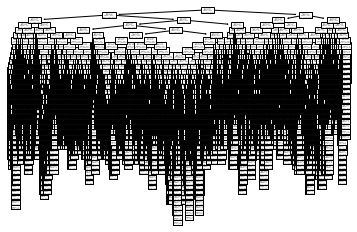

In [58]:
#import graphviz 
tree.plot_tree(clf) #####

In [67]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
for i in [1,5,10,15,20,50,100]:
    RF = tree.DecisionTreeClassifier(random_state=0)
    #RF = XGBClassifier( max_depth= i)
    start = time.time()
    RF.fit(X_train[ten_feature],y_train)
    end = time.time()

    pred = RF.predict_proba(X_test[ten_feature])[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('AUC is {}'.format(roc_score))
    print('time is {}'.format(end-start))
######Random forest 
#n_estimators =1  0.5427   0.17
#              5  0.5929   0.64
#              10 0.6210   1.23
#              50 0.6598   5.91
#              100 0.6661  11.72
#              500 0.6735  58.21
#              1000 0.6757 116.76

NameError: name 'ten_feature' is not defined

In [70]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
for i in [1,5,10,15,20,50,100]:
    RF = XGBClassifier(max_depth = i)
    start = time.time()
    RF.fit(X_train,y_train)
    end = time.time()

    pred = RF.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('AUC is {}'.format(roc_score))
    #print('time is {}'.format(end-start))


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:19:08] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6662257823565092
[18:19:08] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6822062469071071
[18:19:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6561184405458695
[18:19:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6366082578499371
[18:19:21] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6355750958312067
[18:19:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.641019072388047
[18:19:50] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUC is 0.6393363252629831


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


In [78]:
RF = XGBClassifier(min_samples_split = i)

In [80]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
for i in [0.1,0.2,0.3,0.4,0.5,0.6,0.7]:
    RF = XGBClassifier(learning_rate = i)
    start = time.time()
    RF.fit(X_train,y_train)
    end = time.time()

    pred = RF.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('AUC is {}'.format(roc_score))
    print('time is {}'.format(end-start))


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:33:59] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6837068526875398
time is 1.6897401809692383
[18:34:00] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6831233527193414
time is 1.6092829704284668
[18:34:02] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6785893654120315
time is 1.5571796894073486
[18:34:04] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6755365733149454
time is 1.5596113204956055
[18:34:05] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6699713437156292
time is 1.5772409439086914
[18:34:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


AUC is 0.6652816258495275
time is 1.5926275253295898
[18:34:08] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUC is 0.6619174308083949
time is 1.607395887374878


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


In [266]:
for i in [1,5,10,15,20]:
    RF = RandomForestClassifier(n_estimators = 100, max_depth = i)
    RF.fit(X_train,y_train)
    pred = RF.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('max_depth = '+str(i)+'AUC is {}'.format(roc_score))

max_depth = 1AUC is 0.6493349795151585
max_depth = 5AUC is 0.6635327935863288
max_depth = 10AUC is 0.6743910394137349
max_depth = 15AUC is 0.6775462945008168
max_depth = 20AUC is 0.6746222210501331


In [45]:
for i in [2,3,4,5,6,7,8,9,10]:
    RF = RandomForestClassifier(n_estimators = 100, min_samples_split = i)
    RF.fit(X_train,y_train)
    pred = RF.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('min_samples_split = '+str(i)+'AUC is {}'.format(roc_score))

min_samples_split = 2AUC is 0.6646141232937702
min_samples_split = 3AUC is 0.6688149313629828
min_samples_split = 4AUC is 0.6697071001189842
min_samples_split = 5AUC is 0.6727337529067378
min_samples_split = 6AUC is 0.673217019870529
min_samples_split = 7AUC is 0.6729285566912755
min_samples_split = 8AUC is 0.6735515370999794
min_samples_split = 9AUC is 0.6723652429404474
min_samples_split = 10AUC is 0.6753351571383585


In [ ]:
for i in [1,2,3,4,5,6,7,8,9,10]:
    RF = RandomForestClassifier(n_estimators = 100, min_samples_leaf = i)
    RF.fit(X_train,y_train)
    pred = RF.predict_proba(X_test)[:, 1]
    roc_score = roc_auc_score(y_test, pred)
    print('min_samples_leaf = '+str(i)+'AUC is {}'.format(roc_score))

min_samples_left = 1AUC is 0.6669591761386112
min_samples_left = 2AUC is 0.6736034860686013
min_samples_left = 3AUC is 0.6757308535376492
min_samples_left = 4AUC is 0.6770474758114433
min_samples_left = 5AUC is 0.6808363182821587
min_samples_left = 6AUC is 0.6781454043681345
min_samples_left = 7AUC is 0.6795526610127159
min_samples_left = 8AUC is 0.6793012349854102
min_samples_left = 9AUC is 0.6794321254438642


In [129]:
accuracy_score(y_test,y_pred)

0.8862140119878157

In [137]:
dia.shape

(101763, 47)

/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


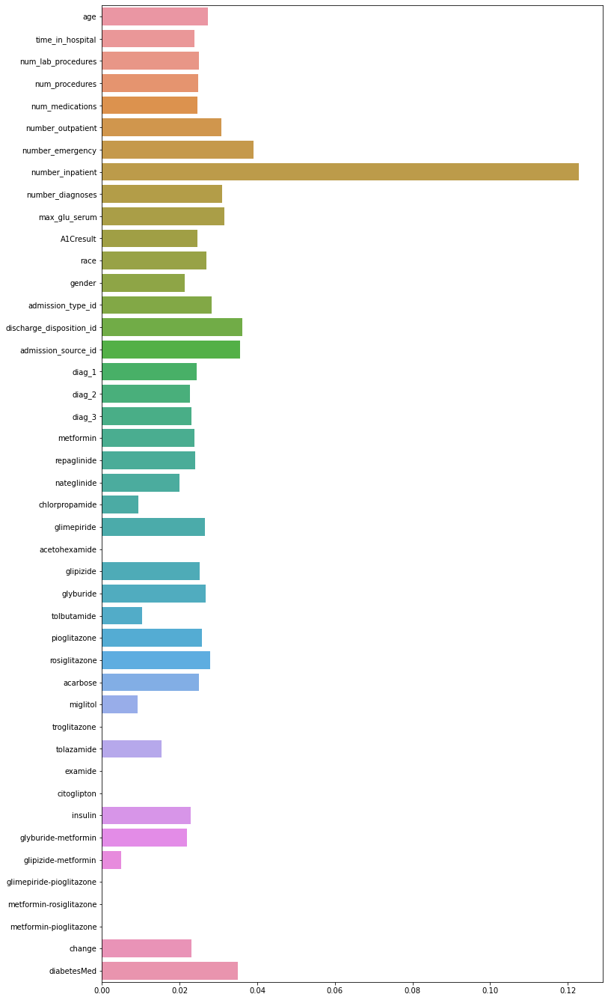

In [64]:
plt.figure(figsize=(12,24))
sns.barplot(RF.feature_importances_,X_train.columns);

In [131]:
z = pd.DataFrame([RF.feature_importances_,X_train.columns]).T

<AxesSubplot:xlabel='importance', ylabel='Feature'>

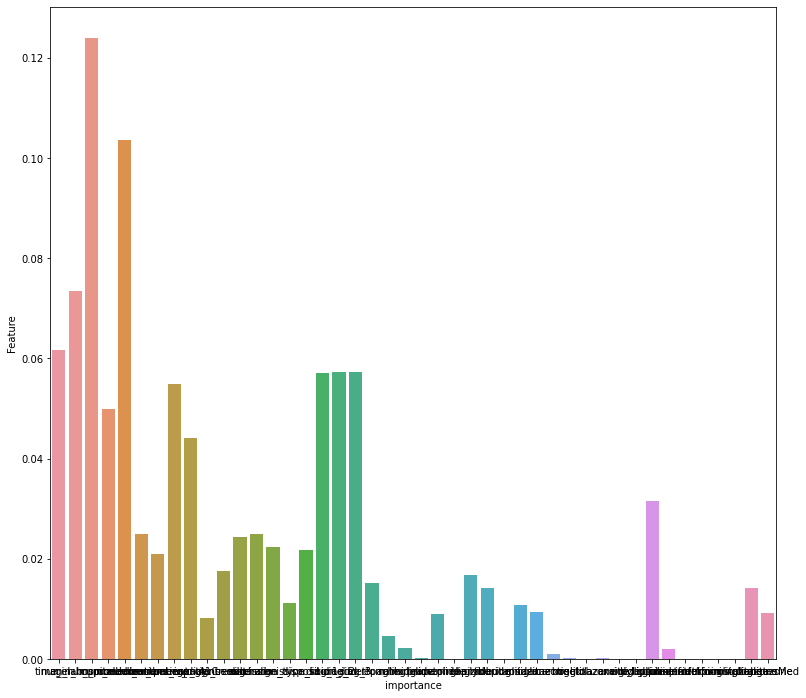

In [132]:
z.columns = ['Feature','importance']
plt.figure(figsize=(13,12))

sns.barplot(y=z['Feature'],x=z['importance'])

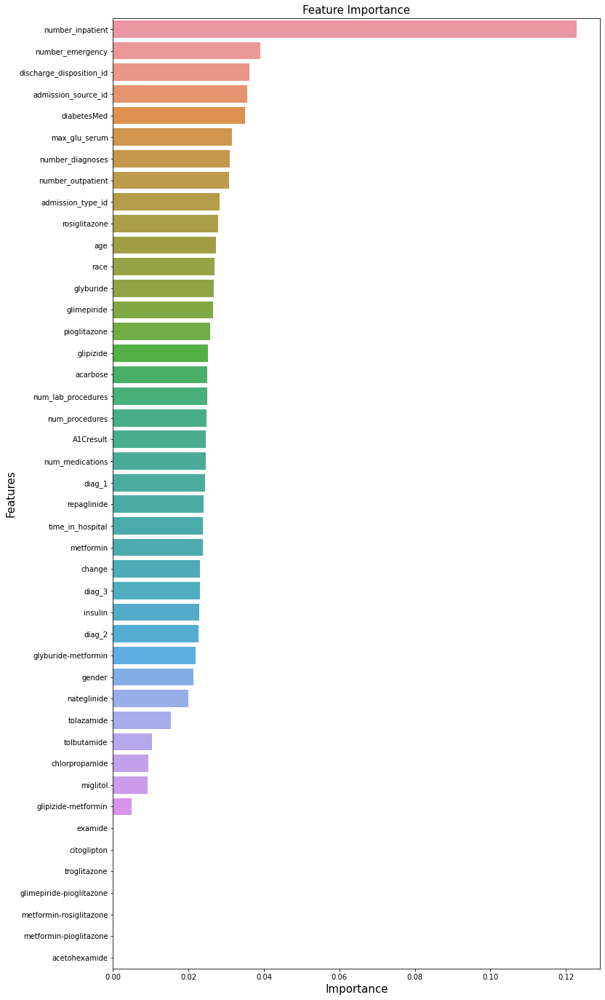

In [67]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': RF.feature_importances_})


important_features = important_features.sort_values('Importance', ascending = False)


plt.figure(figsize=(12,24))
sns.barplot(x = 'Importance', y = 'Features', data = important_features)


plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)


plt.show()

In [44]:
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score

def cross_val(X, y, model, params, folds=9):

    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=3)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
        print(f"Fold: {fold}")
        x_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
        x_test, y_test = X.iloc[test_idx], y.iloc[test_idx]

        alg = model(**params)
        alg.fit(x_train, y_train,
                eval_set=[(x_test, y_test)],
                early_stopping_rounds=100,
                verbose=400)

        pred = alg.predict_proba(x_test)[:, 1]
        roc_score = roc_auc_score(y_test, pred)
        print(f"roc_auc_score: {roc_score}")
        print("-"*50)
    
    return alg

In [135]:
xgb_params= {'n_estimators': 20000, 
             'max_depth': 6, 
             'learning_rate': 0.0201, 
             'reg_lambda': 29.326, 
             'subsample': 0.818, 
             'colsample_bytree': 0.235, 
             'colsample_bynode': 0.820, 
             'colsample_bylevel': 0.453}

from xgboost import XGBClassifier
xgb_model = cross_val(X, y, XGBClassifier, xgb_params)

Fold: 0
[20:49:14] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68114


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33742
[800]	validation_0-logloss:0.33624
[1200]	validation_0-logloss:0.33597
[1440]	validation_0-logloss:0.33591
roc_auc_score: 0.6461951075804669
--------------------------------------------------
Fold: 1
[20:49:31] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68114


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33416
[800]	validation_0-logloss:0.33164
[1200]	validation_0-logloss:0.33070
[1600]	validation_0-logloss:0.33027
[2000]	validation_0-logloss:0.32996
[2191]	validation_0-logloss:0.32990
roc_auc_score: 0.6723934844704378
--------------------------------------------------
Fold: 2
[20:49:58] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68119


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33242
[800]	validation_0-logloss:0.32965
[1200]	validation_0-logloss:0.32863
[1600]	validation_0-logloss:0.32811
[2000]	validation_0-logloss:0.32780
[2400]	validation_0-logloss:0.32762
[2411]	validation_0-logloss:0.32761
roc_auc_score: 0.683676900855816
--------------------------------------------------
Fold: 3
[20:50:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68116


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33633
[800]	validation_0-logloss:0.33449
[1200]	validation_0-logloss:0.33371
[1600]	validation_0-logloss:0.33330
[2000]	validation_0-logloss:0.33314
[2192]	validation_0-logloss:0.33310
roc_auc_score: 0.659471088501111
--------------------------------------------------
Fold: 4
[20:50:53] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68119


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33343
[800]	validation_0-logloss:0.33096
[1200]	validation_0-logloss:0.32999
[1600]	validation_0-logloss:0.32959
[1974]	validation_0-logloss:0.32948
roc_auc_score: 0.6747626173502914
--------------------------------------------------
Fold: 5
[20:51:17] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68117


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33661
[800]	validation_0-logloss:0.33506
[1138]	validation_0-logloss:0.33482
roc_auc_score: 0.6523922854287245
--------------------------------------------------
Fold: 6
[20:51:30] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68117


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33469
[800]	validation_0-logloss:0.33274
[1200]	validation_0-logloss:0.33199
[1600]	validation_0-logloss:0.33167
[2000]	validation_0-logloss:0.33139
[2279]	validation_0-logloss:0.33128
roc_auc_score: 0.6659311229420066
--------------------------------------------------
Fold: 7
[20:51:58] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68116


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33611
[800]	validation_0-logloss:0.33422
[1200]	validation_0-logloss:0.33356
[1600]	validation_0-logloss:0.33329
[1947]	validation_0-logloss:0.33311
roc_auc_score: 0.6571178902545518
--------------------------------------------------
Fold: 8
[20:52:21] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.68115


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[400]	validation_0-logloss:0.33574
[800]	validation_0-logloss:0.33371
[1200]	validation_0-logloss:0.33310
[1323]	validation_0-logloss:0.33313
roc_auc_score: 0.6576154925655471
--------------------------------------------------


/home/rui/.conda/envs/py_rui/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


In [42]:
import pandas as pd
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 100000)
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas_profiling  ## pip install pandas_profiling
from sklearn.model_selection import train_test_split
import statsmodels.api as sm 
from sklearn.metrics import confusion_matrix, accuracy_score, roc_curve, auc, precision_score, recall_score

from collections import Counter


In [197]:
report = pandas_profiling.ProfileReport(dia)

In [201]:
report

In [ ]:
###############
1.不同模型的差别，为什么有些模型适合，模型对于临床数据集的优缺点，适合做什么的改进。
2.模型参数对结果的影响，我们可以思考一下，为什么什么样的参数好。
3.不同的填充方法，对结果的影响，为什么有差别。
4，数据的不同表征对结果有什么影响。

标准 ：AUC,训练时间的考量

In [82]:
import pandas as pd # 数据处理
import numpy as np # 使用数组
import matplotlib.pyplot as plt # 可视化
from matplotlib import rcParams # 图大小
from termcolor import colored as cl # 文本自定义

from sklearn.tree import DecisionTreeClassifier as dtc # 树算法
from sklearn.model_selection import train_test_split # 拆分数据
from sklearn.metrics import accuracy_score # 模型准确度
from sklearn.tree import plot_tree # 树图

rcParams['figure.figsize'] = (25, 20)

In [84]:
model = dtc(criterion = 'entropy', max_depth = 4)
model.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [85]:
pred_model = model.predict(X_test)

print(cl('Accuracy of the model is {:.0%}'.format(accuracy_score(y_test, pred_model)), attrs = ['bold']))

Accuracy of the model is 62%


In [88]:
dia.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide',
       'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide',
       'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose',
       'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton',
       'insulin', 'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

TypeError: can only concatenate str (not "int") to str

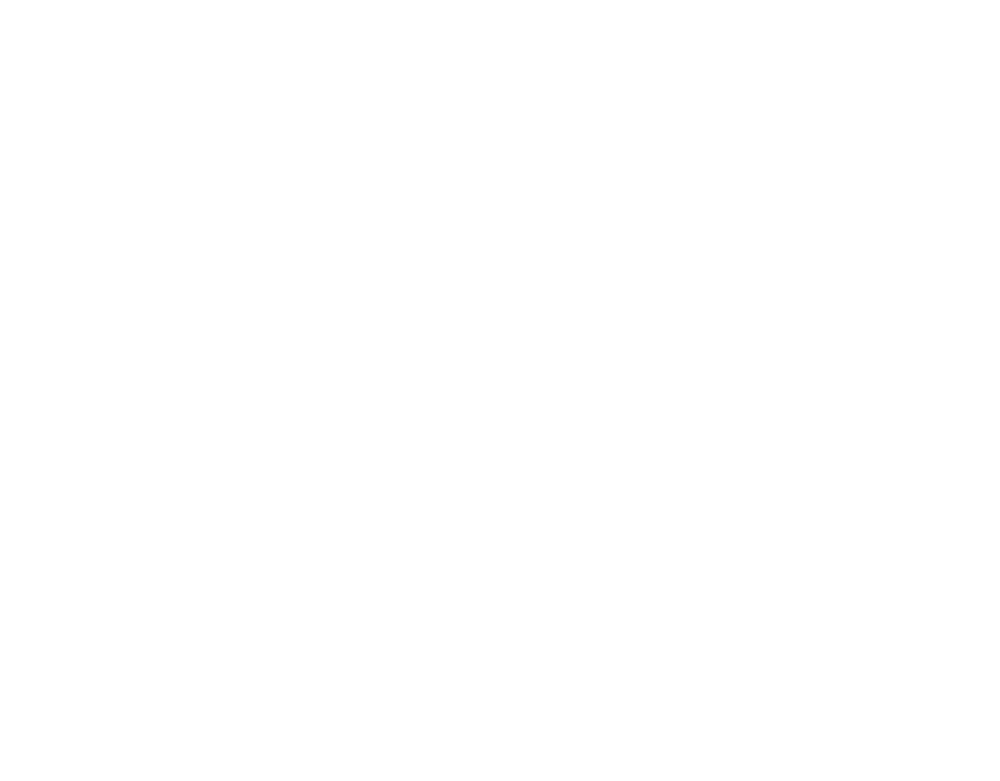

In [90]:
feature_names = dia.columns[:30]
target_names = dia['readmitted'].unique().tolist()

plot_tree(model, 
          feature_names = feature_names, 
          class_names = target_names, 
          filled = True, 
          rounded = True)

plt.savefig('tree_visualization.png') 